In [27]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from scipy.stats import pearsonr, spearmanr
from scipy.stats import linregress
from scipy import stats

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
plt.style.use('default')
sns.set_palette("husl")

%matplotlib inline


In [28]:
# Define column mapping
rename = {
    'Ladeeinrichtungs-ID': 'station_id',
    'Betreiber': 'operator',
    'Anzeigename (Karte)': 'name_map',
    'Status': 'status',
    'Art der Ladeeinrichtung': 'equipment_type',
    'Anzahl Ladepunkte': 'n_ports',
    'Nennleistung Ladeeinrichtung [kW]': 'power_kw',
    'Inbetriebnahmedatum': 'commissioning_date',
    'Straße': 'street',
    'Hausnummer': 'house_no',
    'Postleitzahl': 'zip',
    'Ort': 'city',
    'Kreis/kreisfreie Stadt': 'district',
    'Bundesland': 'state',
    'Breitengrad': 'lat',
    'Längengrad': 'lon',
    'Bezahlsysteme': 'payment',
    'Öffnungszeiten': 'opening_hours'
}

# Load data - only columns we need
df = pd.read_csv('Ladesaeulenregister_BNetzA.CSV', 
                 sep=';', 
                 encoding='utf-8-sig',
                 usecols=list(rename.keys()),
                 decimal=',',
                 low_memory=False).rename(columns=rename)

# Convert numeric columns
df['n_ports'] = pd.to_numeric(df['n_ports'], errors='coerce')

# Create derived columns
df['commissioning_year'] = pd.to_datetime(df['commissioning_date'], 
                                           format='%d.%m.%Y', 
                                           errors='coerce').dt.year
df['power_per_port'] = df['power_kw'] / df['n_ports']
df['power_category'] = pd.cut(df['power_kw'], 
                               bins=[0, 22, 50, 150, 1000],
                               labels=['Low (≤22kW)', 'Medium (22-50kW)', 
                                      'Fast (50-150kW)', 'Ultra-fast (>150kW)'])

# Store used dataset 
df.to_csv(r"C:\Users\jaron\Documents\GenAI\Projekt\Ladesaeulenregister_BNetzA_smaller.CSV", index=False)


In [29]:
# Display first few rows and data info
display(df.head(3))
print("\n" + "="*60)
df.info()
print("="*60)

,station_id,operator,name_map,status,equipment_type,n_ports,power_kw,commissioning_date,street,house_no,zip,city,district,state,lat,lon,payment,opening_hours,commissioning_year,power_per_port,power_category
0,1010338,Albwerk Elektro- und Kommunikationstechnik GmbH,Albwerk Elektro- und Kommunikationstechnik GmbH,In Betrieb,Normalladeeinrichtung,2,22.0,11.01.2020,Ennabeurer Weg,0,72535,Heroldstatt,Landkreis Alb-Donau-Kreis,Baden-Württemberg,48.442398,9.659075,NaN,Keine Angabe,2020,11.0,Low (≤22kW)
1,1063962,smopi® - Multi Chargepoint Solution GmbH,smopi,In Betrieb,Normalladeeinrichtung,4,22.0,23.11.2022,Albstraße,15,72535,Heroldstatt,Landkreis Alb-Donau-Kreis,Baden-Württemberg,48.449424,9.672201,Onlinezahlungsverfahren;RFID-Karte,Keine Angabe,2022,5.5,Low (≤22kW)
2,1063963,smopi® - Multi Chargepoint Solution GmbH,smopi,In Betrieb,Normalladeeinrichtung,4,22.0,23.11.2022,Albstraße,15,72535,Heroldstatt,Landkreis Alb-Donau-Kreis,Baden-Württemberg,48.449424,9.672201,Onlinezahlungsverfahren;RFID-Karte,Keine Angabe,2022,5.5,Low (≤22kW)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95565 entries, 0 to 95564
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   station_id          95565 non-null  int64   
 1   operator            95565 non-null  object  
 2   name_map            41438 non-null  object  
 3   status              95565 non-null  object  
 4   equipment_type      95565 non-null  object  
 5   n_ports             95565 non-null  int64   
 6   power_kw            95565 non-null  float64 
 7   commissioning_date  95565 non-null  object  
 8   street              95565 non-null  object  
 9   house_no            95565 non-null  object  
 10  zip                 95565 non-null  int64   
 11  city                95565 non-null  object  
 12  district            95565 non-null  object  
 13  state               95565 non-null  object  
 14  lat                 95565 non-null  float64 
 15  lon                 95565 non-null 

In [30]:
df.describe()

,station_id,n_ports,power_kw,zip,lat,lon,commissioning_year,power_per_port
count,9.556500e+04,95565.000000,95565.000000,95565.000000,95565.000000,95565.000000,95565.000000,95565.000000
mean,1.067844e+06,1.822759,73.583519,54224.851682,50.619871,9.710974,2022.125893,44.744391
std,3.847023e+04,0.635989,94.218379,27264.734531,1.805896,2.048970,2.241131,67.010655
min,1.000000e+06,1.000000,1.000000,1011.000000,47.352641,5.895952,1992.000000,0.925000
25%,1.035957e+06,1.000000,22.000000,31275.000000,48.938258,8.180606,2021.000000,11.000000
50%,1.065072e+06,2.000000,44.000000,54293.000000,50.755785,9.468550,2023.000000,22.000000
75%,1.102919e+06,2.000000,50.000000,78476.000000,52.050517,11.320881,2024.000000,23.666667
max,1.134544e+06,6.000000,1200.000000,99996.000000,55.122778,14.999334,2025.000000,500.000000


In [31]:
print("="*70)
print(" "*20 + "CHARGING STATION ANALYSIS")
print("="*70)

# 1. Overall Dataset
print("\n📊 DATASET OVERVIEW")
print(f"   Total stations: {len(df):,}")
print(f"   Unique station IDs: {df['station_id'].nunique():,}")
print(f"   Date range: {df['commissioning_year'].min():.0f} - {df['commissioning_year'].max():.0f}")

# 2. Operational Status
print("\n⚡ OPERATIONAL STATUS")
for status, count in df['status'].value_counts().items():
    pct = count / len(df) * 100
    print(f"   {status}: {count:,} ({pct:.2f}%)")

# 3. Capacity Metrics
print("\n🔌 CAPACITY METRICS")
print(f"   Total charging ports: {df['n_ports'].sum():,.0f}")
print(f"   Average ports per station: {df['n_ports'].mean():.2f}")
print(f"   Total power capacity: {df['power_kw'].sum():,.0f} kW")
print(f"   Average power per station: {df['power_kw'].mean():.2f} kW")
print(f"   Average power per port: {df['power_per_port'].mean():.2f} kW")

# 4. Power Categories
print("\n⚡ POWER CATEGORIES")
for cat, count in df['power_category'].value_counts().sort_index().items():
    pct = count / len(df) * 100
    print(f"   {cat}: {count:,} ({pct:.2f}%)")

# 5. Market Concentration
print("\n🏢 TOP 5 OPERATORS")
top5_operators = df['operator'].value_counts().head(5)
for operator, count in top5_operators.items():
    pct = count / len(df) * 100
    print(f"   {operator}: {count:,} ({pct:.2f}%)")
print(f"   Top 5 market share: {(top5_operators.sum()/len(df)*100):.2f}%")

# 6. Geographic Distribution
print("\n🗺️  TOP 5 STATES")
for state, count in df['state'].value_counts().head(5).items():
    pct = count / len(df) * 100
    print(f"   {state}: {count:,} ({pct:.2f}%)")

# 7. Growth Statistics
print("\n📈 GROWTH STATISTICS")
yearly_growth = df['commissioning_year'].value_counts().sort_index()
for year in [2020, 2022, 2024]:
    if year in yearly_growth.index:
        print(f"   Stations in {year}: {yearly_growth[year]:,}")
if 2020 in yearly_growth.index and 2024 in yearly_growth.index:
    growth = ((yearly_growth[2024] - yearly_growth[2020]) / yearly_growth[2020] * 100)
    print(f"   Growth 2020-2024: {growth:.1f}%")

# 8. Data Quality
print("\n🔍 DATA QUALITY")
missing_coords = df[['lat', 'lon']].isna().any(axis=1).sum()
print(f"   Missing coordinates: {missing_coords:,} ({missing_coords/len(df)*100:.2f}%)")
print(f"   Missing dates: {df['commissioning_date'].isna().sum():,}")
print(f"   Zero power stations: {(df['power_kw'] == 0).sum():,}")

# 9. Equipment Types
print("\n🔧 TOP 3 EQUIPMENT TYPES")
for eq_type, count in df['equipment_type'].value_counts().head(3).items():
    pct = count / len(df) * 100
    print(f"   {eq_type}: {count:,} ({pct:.2f}%)")

print("="*70)

                    CHARGING STATION ANALYSIS

📊 DATASET OVERVIEW
   Total stations: 95,565
   Unique station IDs: 95,565
   Date range: 1992 - 2025

⚡ OPERATIONAL STATUS
   In Betrieb: 95,555 (99.99%)
   In Wartung: 10 (0.01%)

🔌 CAPACITY METRICS
   Total charging ports: 174,192
   Average ports per station: 1.82
   Total power capacity: 7,032,009 kW
   Average power per station: 73.58 kW
   Average power per port: 44.74 kW

⚡ POWER CATEGORIES
   Low (≤22kW): 41,240 (43.15%)
   Medium (22-50kW): 31,332 (32.79%)
   Fast (50-150kW): 9,506 (9.95%)
   Ultra-fast (>150kW): 13,485 (14.11%)

🏢 TOP 5 OPERATORS
   EnBW mobility+ AG und Co.KG : 4,516 (4.73%)
   Tesla Germany GmbH: 3,584 (3.75%)
   E.ON Drive GmbH: 3,002 (3.14%)
   EWE Go GmbH: 1,508 (1.58%)
   Mercedes-Benz AG: 1,362 (1.43%)
   Top 5 market share: 14.62%

🗺️  TOP 5 STATES
   Bayern: 19,181 (20.07%)
   Nordrhein-Westfalen: 18,265 (19.11%)
   Baden-Württemberg: 15,842 (16.58%)
   Niedersachsen: 9,394 (9.83%)
   Hessen: 7,592 (7.9

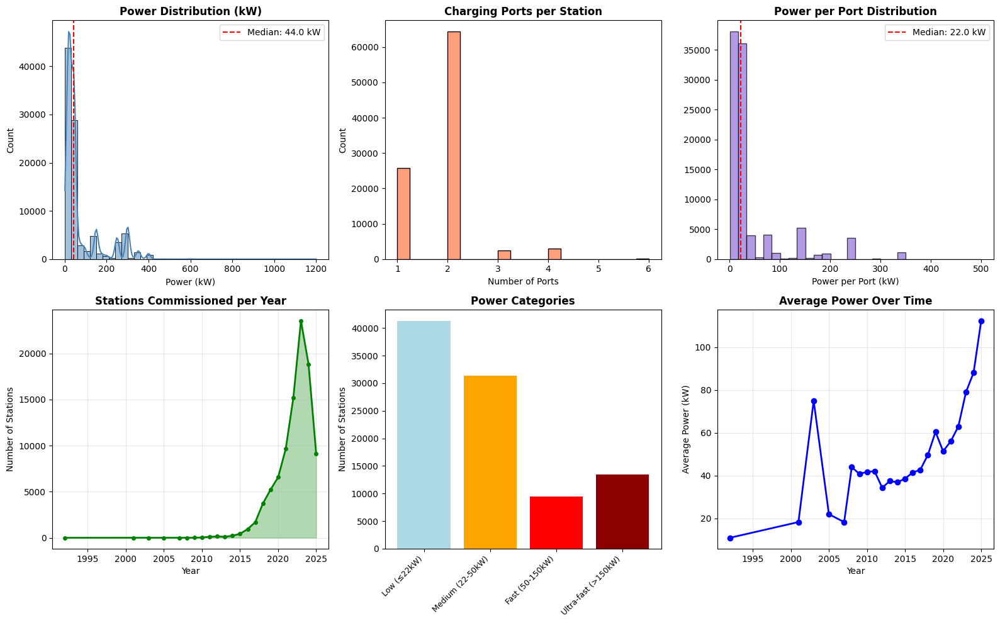

In [32]:
# Create numerical visualizations
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes_flat = axes.flatten()

# Plot 1: Power Distribution
sns.histplot(df['power_kw'], kde=True, bins=40, ax=axes_flat[0], color='steelblue')
axes_flat[0].set_title('Power Distribution (kW)', fontsize=12, fontweight='bold')
axes_flat[0].set_xlabel('Power (kW)')
axes_flat[0].axvline(df['power_kw'].median(), color='red', linestyle='--', 
                     label=f'Median: {df["power_kw"].median():.1f} kW')
axes_flat[0].legend()

# Plot 2: Ports Distribution
sns.histplot(df['n_ports'], kde=False, bins=20, ax=axes_flat[1], color='coral')
axes_flat[1].set_title('Charging Ports per Station', fontsize=12, fontweight='bold')
axes_flat[1].set_xlabel('Number of Ports')

# Plot 3: Power per Port
axes_flat[2].hist(df['power_per_port'].dropna(), bins=30, color='mediumpurple', 
                  edgecolor='black', alpha=0.7)
axes_flat[2].set_title('Power per Port Distribution', fontsize=12, fontweight='bold')
axes_flat[2].set_xlabel('Power per Port (kW)')
axes_flat[2].axvline(df['power_per_port'].median(), color='red', linestyle='--', 
                     label=f'Median: {df["power_per_port"].median():.1f} kW')
axes_flat[2].legend()

# Plot 4: Commissioning Trend
yearly_counts = df['commissioning_year'].value_counts().sort_index()
axes_flat[3].plot(yearly_counts.index, yearly_counts.values, marker='o', 
                  linewidth=2, color='green', markersize=4)
axes_flat[3].fill_between(yearly_counts.index, yearly_counts.values, alpha=0.3, color='green')
axes_flat[3].set_title('Stations Commissioned per Year', fontsize=12, fontweight='bold')
axes_flat[3].set_xlabel('Year')
axes_flat[3].set_ylabel('Number of Stations')
axes_flat[3].grid(True, alpha=0.3)

# Plot 5: Power Category Distribution
power_cat_counts = df['power_category'].value_counts().sort_index()
bars = axes_flat[4].bar(range(len(power_cat_counts)), power_cat_counts.values, 
                        color=['lightblue', 'orange', 'red', 'darkred'])
axes_flat[4].set_xticks(range(len(power_cat_counts)))
axes_flat[4].set_xticklabels(power_cat_counts.index, rotation=45, ha='right', fontsize=9)
axes_flat[4].set_title('Power Categories', fontsize=12, fontweight='bold')
axes_flat[4].set_ylabel('Number of Stations')

# Plot 6: Average Power Over Time
yearly_avg_power = df.groupby('commissioning_year')['power_kw'].mean().dropna()
axes_flat[5].plot(yearly_avg_power.index, yearly_avg_power.values, 
                  marker='o', linewidth=2, color='blue')
axes_flat[5].set_title('Average Power Over Time', fontsize=12, fontweight='bold')
axes_flat[5].set_xlabel('Year')
axes_flat[5].set_ylabel('Average Power (kW)')
axes_flat[5].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

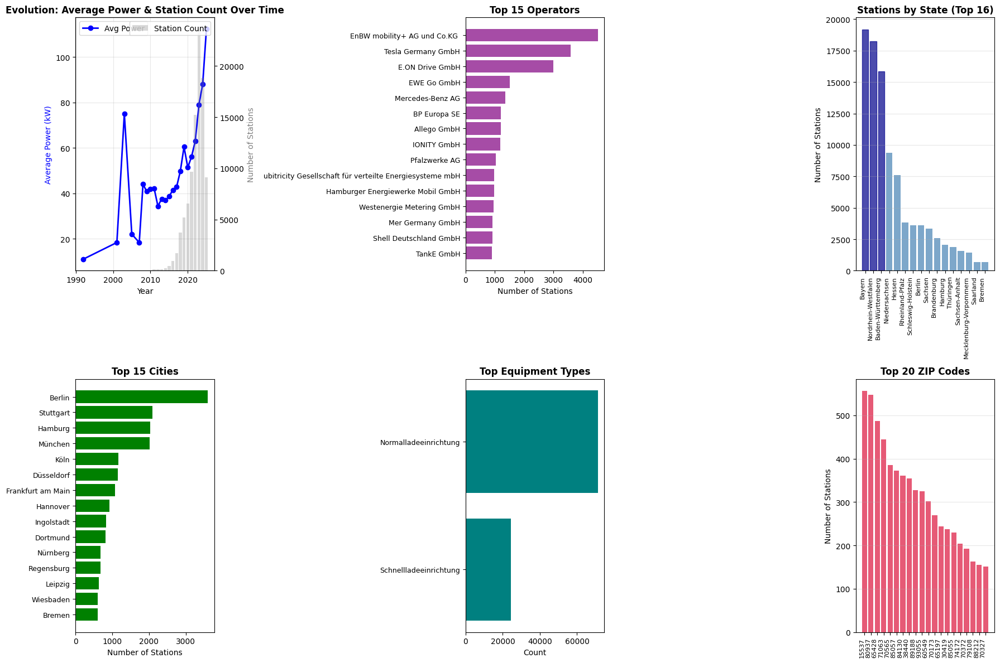

In [33]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes_flat = axes.flatten()

# === Plot 1: Commissioning Year vs Average Power (Trend Analysis) ===
df['commissioning_year'] = pd.to_datetime(
    df['commissioning_date'], format='%d.%m.%Y', errors='coerce'
).dt.year

yearly_avg_power = df.groupby('commissioning_year')['power_kw'].mean().dropna()
yearly_station_count = df.groupby('commissioning_year').size()

ax1 = axes_flat[0]
ax1_twin = ax1.twinx()

ax1.plot(
    yearly_avg_power.index, yearly_avg_power.values,
    marker='o', color='blue', linewidth=2, label='Avg Power'
)
ax1_twin.bar(
    yearly_station_count.index, yearly_station_count.values,
    alpha=0.3, color='gray', label='Station Count'
)

ax1.set_title('Evolution: Average Power & Station Count Over Time', fontsize=12, fontweight='bold')
ax1.set_xlabel('Year')
ax1.set_ylabel('Average Power (kW)', color='blue')
ax1_twin.set_ylabel('Number of Stations', color='gray')
ax1.legend(loc='upper left')
ax1_twin.legend(loc='upper right')
ax1.grid(alpha=0.3)

# === Plot 2: Top 15 Operators ===
top15_operators = df['operator'].value_counts().head(15)
axes_flat[1].barh(range(len(top15_operators)), top15_operators.values, color='purple', alpha=0.7)
axes_flat[1].set_yticks(range(len(top15_operators)))
axes_flat[1].set_yticklabels(top15_operators.index, fontsize=9)
axes_flat[1].set_title('Top 15 Operators', fontsize=12, fontweight='bold')
axes_flat[1].set_xlabel('Number of Stations')
axes_flat[1].invert_yaxis()

# === Plot 3: Top 16 States ===
top16_states = df['state'].value_counts().head(16)
bars = axes_flat[2].bar(range(len(top16_states)), top16_states.values, color='steelblue', alpha=0.7)
axes_flat[2].set_xticks(range(len(top16_states)))
axes_flat[2].set_xticklabels(top16_states.index, rotation=90, ha='right', fontsize=8)
axes_flat[2].set_title('Stations by State (Top 16)', fontsize=12, fontweight='bold')
axes_flat[2].set_ylabel('Number of Stations')
axes_flat[2].grid(axis='y', alpha=0.3)
for i in range(min(3, len(bars))):
    bars[i].set_color('darkblue')

# === Plot 4: Top 15 Cities ===
top15_cities = df['city'].value_counts().head(15)
axes_flat[3].barh(range(len(top15_cities)), top15_cities.values, color='green')
axes_flat[3].set_yticks(range(len(top15_cities)))
axes_flat[3].set_yticklabels(top15_cities.index, fontsize=9)
axes_flat[3].set_title('Top 15 Cities', fontsize=12, fontweight='bold')
axes_flat[3].set_xlabel('Number of Stations')
axes_flat[3].invert_yaxis()

# === Plot 5: Equipment Types ===
top8_equipment = df['equipment_type'].value_counts().head(8)
axes_flat[4].barh(range(len(top8_equipment)), top8_equipment.values, color='teal')
axes_flat[4].set_yticks(range(len(top8_equipment)))
axes_flat[4].set_yticklabels(top8_equipment.index, fontsize=9)
axes_flat[4].set_title('Top Equipment Types', fontsize=12, fontweight='bold')
axes_flat[4].set_xlabel('Count')
axes_flat[4].invert_yaxis()

# === Plot 6: Top 20 ZIP Codes ===
top20_zips = df['zip'].value_counts().head(20)
axes_flat[5].bar(range(len(top20_zips)), top20_zips.values, color='crimson', alpha=0.7)
axes_flat[5].set_xticks(range(len(top20_zips)))
axes_flat[5].set_xticklabels(top20_zips.index, rotation=90, ha='right', fontsize=8)
axes_flat[5].set_title('Top 20 ZIP Codes', fontsize=12, fontweight='bold')
axes_flat[5].set_ylabel('Number of Stations')
axes_flat[5].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


<h2>Hypothesis I wanna test</h2>
H₀: There is NO relationship between annual station count and average power of new stations.

H₁: There IS a significant relationship between station count and average power.

In [34]:
print("="*70)
print("HYPOTHESIS TEST: Station Count vs Average Power Over Time")
print("="*70)

# Prepare yearly data
yearly_data = df.groupby('commissioning_year').agg({
    'power_kw': 'mean',
    'station_id': 'count'
}).reset_index()
yearly_data.columns = ['year', 'avg_power', 'station_count']

# Filter years with sufficient data
yearly_data = yearly_data[yearly_data['station_count'] >= 100]

print(f"\nData: {len(yearly_data)} years from {yearly_data['year'].min():.0f} to {yearly_data['year'].max():.0f}")
print(f"Station count range: {yearly_data['station_count'].min():.0f} - {yearly_data['station_count'].max():.0f}")
print(f"Avg power range: {yearly_data['avg_power'].min():.2f} - {yearly_data['avg_power'].max():.2f} kW")

# Direct correlation between station_count and avg_power
print("\n" + "="*70)
print("TEST: CORRELATION (Station Count ↔ Average Power)")
print("="*70)

pearson_corr, pearson_p = pearsonr(yearly_data['station_count'], yearly_data['avg_power'])
spearman_corr, spearman_p = spearmanr(yearly_data['station_count'], yearly_data['avg_power'])

print(f"\nPearson correlation: {pearson_corr:.4f}")
print(f"P-value: {pearson_p:.6f}")

print(f"\nSpearman correlation: {spearman_corr:.4f}")
print(f"P-value: {spearman_p:.6f}")


HYPOTHESIS TEST: Station Count vs Average Power Over Time

Data: 15 years from 2011 to 2025
Station count range: 108 - 23561
Avg power range: 34.36 - 112.34 kW

TEST: CORRELATION (Station Count ↔ Average Power)

Pearson correlation: 0.7334
P-value: 0.001860

Spearman correlation: 0.8821
P-value: 0.000014


<h2>Interpretation:</h2>

Results are clear.

=> Because p < 0.01, I reject H₀.

I have statistically significant evidence that:

“I have strong evidence that there is a relation ship between rising Stationcount and Averege Power”


TEST 2: LINEAR REGRESSION (Station Count → Average Power)

Regression equation: Avg Power = 41.82 + 0.002161 × Station Count
R-squared: 0.5379
P-value: 0.001860


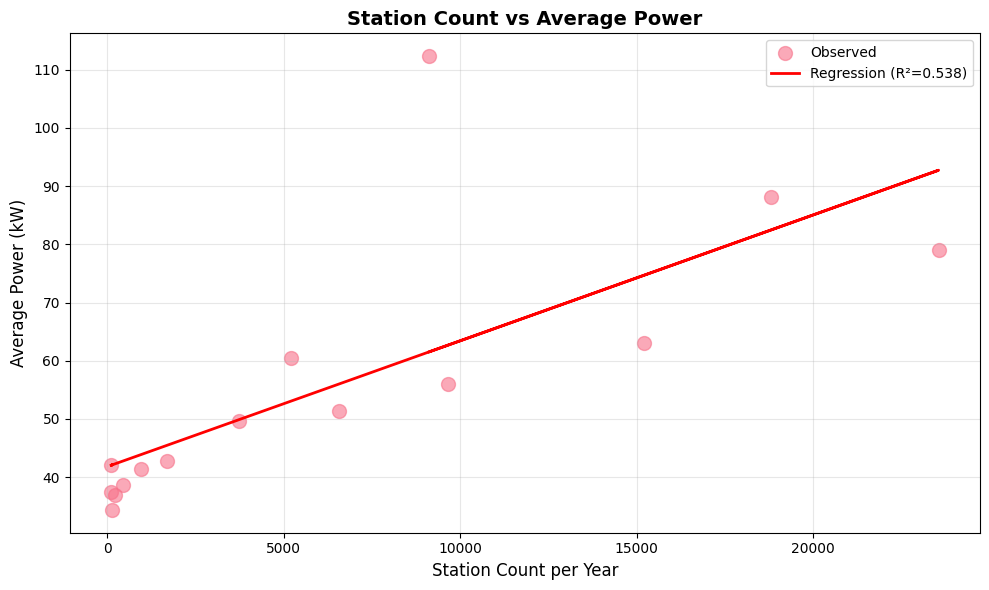

In [35]:
print("\n" + "="*70)
print("TEST 2: LINEAR REGRESSION (Station Count → Average Power)")
print("="*70)

slope, intercept, r_value, p_value, std_err = linregress(
    yearly_data['station_count'], 
    yearly_data['avg_power']
)

print(f"\nRegression equation: Avg Power = {intercept:.2f} + {slope:.6f} × Station Count")
print(f"R-squared: {r_value**2:.4f}")
print(f"P-value: {p_value:.6f}")

# Visualize
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(yearly_data['station_count'], yearly_data['avg_power'], s=100, alpha=0.6, label='Observed')
plt.plot(yearly_data['station_count'], slope * yearly_data['station_count'] + intercept, 
         'r-', linewidth=2, label=f'Regression (R²={r_value**2:.3f})')
plt.xlabel('Station Count per Year', fontsize=12)
plt.ylabel('Average Power (kW)', fontsize=12)
plt.title('Station Count vs Average Power', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

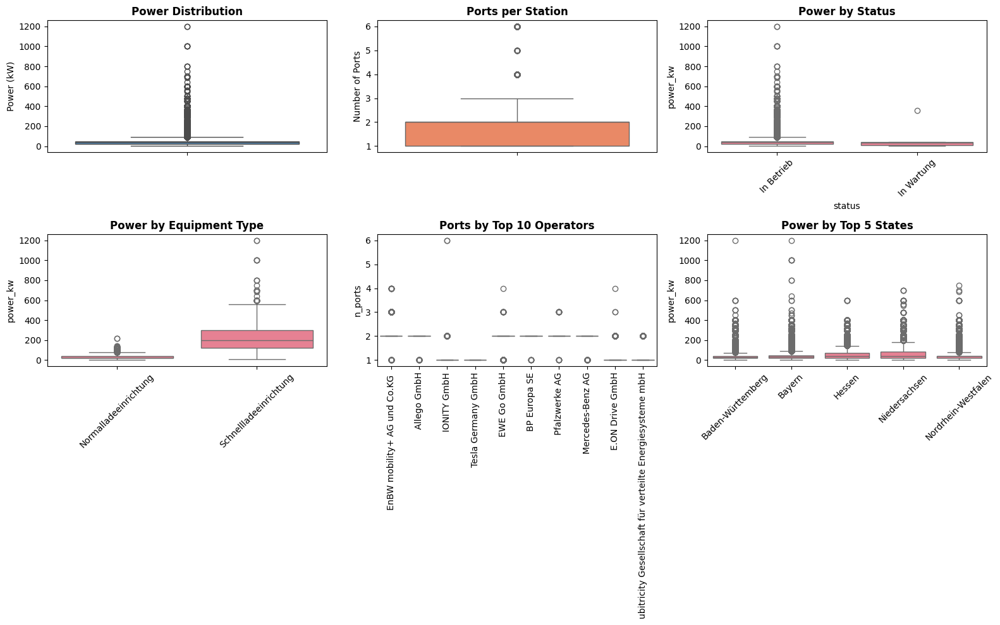


OUTLIER ANALYSIS

Power Outliers: 19949 stations
Range: 93.00 - 1200.00 kW


In [36]:
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes_flat = axes.flatten()

# Boxplot 1: Power Distribution
sns.boxplot(y=df['power_kw'], ax=axes_flat[0], color='steelblue')
axes_flat[0].set_title('Power Distribution', fontsize=12, fontweight='bold')
axes_flat[0].set_ylabel('Power (kW)')

# Boxplot 2: Number of Ports
sns.boxplot(y=df['n_ports'], ax=axes_flat[1], color='coral')
axes_flat[1].set_title('Ports per Station', fontsize=12, fontweight='bold')
axes_flat[1].set_ylabel('Number of Ports')

# Boxplot 3: Power by Status
sns.boxplot(data=df, x='status', y='power_kw', ax=axes_flat[2])
axes_flat[2].set_title('Power by Status', fontsize=12, fontweight='bold')
axes_flat[2].tick_params(axis='x', rotation=45)

# Boxplot 4: Power by Top 5 Equipment Types
top5_equipment = df['equipment_type'].value_counts().head(5).index
df_equipment = df[df['equipment_type'].isin(top5_equipment)]
sns.boxplot(data=df_equipment, x='equipment_type', y='power_kw', ax=axes_flat[3])
axes_flat[3].set_title('Power by Equipment Type', fontsize=12, fontweight='bold')
axes_flat[3].tick_params(axis='x', rotation=45)
axes_flat[3].set_xlabel('')

# Boxplot 5: Ports by Top 10 Operators
top10_operators = df['operator'].value_counts().head(10).index
df_ops = df[df['operator'].isin(top10_operators)]
sns.boxplot(data=df_ops, x='operator', y='n_ports', ax=axes_flat[4])
axes_flat[4].set_title('Ports by Top 10 Operators', fontsize=12, fontweight='bold')
axes_flat[4].tick_params(axis='x', rotation=90)
axes_flat[4].set_xlabel('')

# Boxplot 6: Power by Top 5 States
top5_states = df['state'].value_counts().head(5).index
df_states = df[df['state'].isin(top5_states)]
sns.boxplot(data=df_states, x='state', y='power_kw', ax=axes_flat[5])
axes_flat[5].set_title('Power by Top 5 States', fontsize=12, fontweight='bold')
axes_flat[5].tick_params(axis='x', rotation=45)
axes_flat[5].set_xlabel('')

plt.tight_layout()
plt.show()

# Print outlier insights
print("\n" + "="*60)
print("OUTLIER ANALYSIS")
print("="*60)

Q1 = df['power_kw'].quantile(0.25)
Q3 = df['power_kw'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['power_kw'] < Q1 - 1.5*IQR) | (df['power_kw'] > Q3 + 1.5*IQR)]
print(f"\nPower Outliers: {len(outliers)} stations")
if len(outliers) > 0:
    print(f"Range: {outliers['power_kw'].min():.2f} - {outliers['power_kw'].max():.2f} kW")
print("="*60)

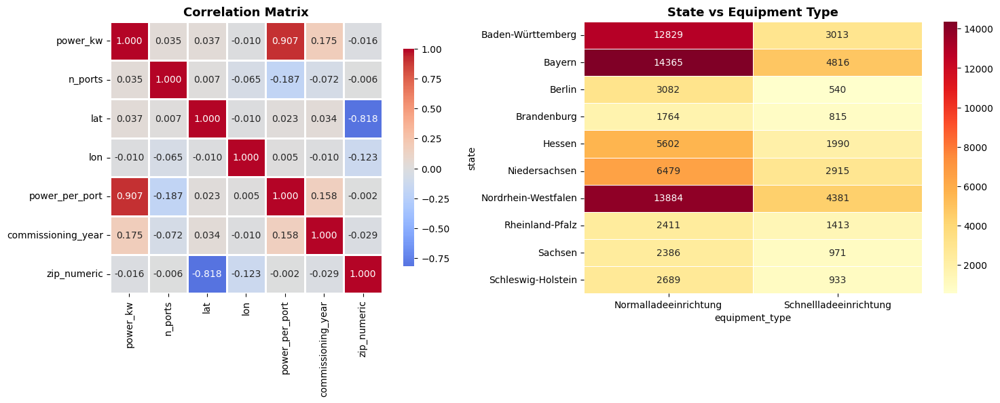


KEY CORRELATIONS
Power vs Ports: 0.035
Power vs Year: 0.175
Power vs Power/Port: 0.907


In [37]:
# Prepare correlation data
df_corr = df[['power_kw', 'n_ports', 'lat', 'lon', 'power_per_port']].copy()
df_corr['commissioning_year'] = df['commissioning_year']
df_corr['zip_numeric'] = pd.to_numeric(df['zip'], errors='coerce')
df_corr_clean = df_corr.dropna()

# Create figure with two heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Heatmap 1: Correlation Matrix
corr_matrix = df_corr_clean.corr()
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='coolwarm', center=0,
            square=True, linewidths=1, cbar_kws={"shrink": 0.8}, ax=axes[0])
axes[0].set_title('Correlation Matrix', fontsize=13, fontweight='bold')

# Heatmap 2: State vs Equipment Type
top10_states = df['state'].value_counts().head(10).index
top5_equipment = df['equipment_type'].value_counts().head(5).index
df_crosstab = df[df['state'].isin(top10_states) & df['equipment_type'].isin(top5_equipment)]
crosstab = pd.crosstab(df_crosstab['state'], df_crosstab['equipment_type'])
sns.heatmap(crosstab, annot=True, fmt='d', cmap='YlOrRd', linewidths=0.5, ax=axes[1])
axes[1].set_title('State vs Equipment Type', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

# Print correlation insights
print("\n" + "="*60)
print("KEY CORRELATIONS")
print("="*60)
print(f"Power vs Ports: {corr_matrix.loc['power_kw', 'n_ports']:.3f}")
print(f"Power vs Year: {corr_matrix.loc['power_kw', 'commissioning_year']:.3f}")
print(f"Power vs Power/Port: {corr_matrix.loc['power_kw', 'power_per_port']:.3f}")
print("="*60)

In [38]:
# Filter stations with valid coordinates
df_map = df[df['lat'].notna() & df['lon'].notna()].copy()

# For performance, sample or filter
# Sample 5000 stations
df_sample = df_map.sample(n=min(5000, len(df_map)), random_state=42)


# Function to determine marker color
def get_color(power):
    if pd.isna(power) or power == 0:
        return 'gray'
    elif power <= 22:
        return 'blue'
    elif power <= 50:
        return 'orange'
    elif power <= 150:
        return 'darkorange'
    else:
        return 'red'

# Create map
m = folium.Map(
    location=[51.1657, 10.4515],
    zoom_start=6,
    tiles='OpenStreetMap'
)

# Add marker cluster
marker_cluster = MarkerCluster(
    options={'maxClusterRadius': 50, 'disableClusteringAtZoom': 13}
).add_to(m)

# Add markers
for idx, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=4,
        popup=folium.Popup(f"""
            <div style='width: 200px'>
                <h4>{row['operator']}</h4>
                <b>City:</b> {row['city']}<br>
                <b>Power:</b> {row['power_kw']} kW<br>
                <b>Ports:</b> {row['n_ports']}<br>
                <b>Status:</b> {row['status']}<br>
            </div>
        """, max_width=250),
        tooltip=f"{row['city']} - {row['power_kw']} kW",
        color='white',
        fillColor=get_color(row['power_kw']),
        fillOpacity=0.7,
        weight=1
    ).add_to(marker_cluster)

# Add legend
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; right: 50px; width: 180px; height: 160px; 
            background-color: white; border:2px solid grey; z-index:9999; 
            font-size:14px; padding: 10px">
<p style="margin-bottom: 8px; font-weight: bold;">Power Levels</p>
<p><i class="fa fa-circle" style="color:blue"></i> ≤22 kW (Low)</p>
<p><i class="fa fa-circle" style="color:orange"></i> 22-50 kW (Medium)</p>
<p><i class="fa fa-circle" style="color:darkorange"></i> 50-150 kW (Fast)</p>
<p><i class="fa fa-circle" style="color:red"></i> >150 kW (Ultra-fast)</p>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))
m.save('map.html')
display(m)